For checking the MOT stability vs B gradient and detuning. See the Gaudesius PhD thesis on MOT instability from Universite Cote D'Azur

In [1]:
import numpy as np
from numpy import unravel_index
from matplotlib import pyplot as plt
from matplotlib import image
import matplotlib as mpl
import h5py
import os
from os import walk
import csv
import json
import tifffile  # to load tiff files efficiently
import cv2 # Open-CV for selecting a ROI
import itertools #to flatten a list of list
from scipy.optimize import curve_fit
from scipy import misc
import scipy.ndimage as ndi # for getting center of mass of an image and gaussian filtering
import datetime
import datetime as dt
from datetime import time
from PIL import Image

kHz = 1e3
MHz = 1e6
ms = 1e-3
us = 1e-6
V = 1

# for using datetime on x axis
import matplotlib.dates as mdates
import matplotlib.units as munits
munits.registry[dt.datetime] = mdates.ConciseDateConverter()

results = "C:\\Networking Experiment\\artiq codes\\artiq-master\\results\\"

# for reading the database parameters from goodlogger's my_config.cfg
goodlogger_dir = "C:\\Users\\QC\OneDrive - UW-Madison\\Documents\\LabSoftware\\GOOD_logger"

import psycopg2 as pg
from configparser import ConfigParser
cp = ConfigParser()
cp.read(os.path.join(goodlogger_dir,"my_config.cfg"))
conn_params = {'database':cp['DATABASE_SETUP']['Database'],
                'host':cp['DATABASE_SETUP']['Host'],
                'user':cp['DATABASE_SETUP']['User'],
                'password':cp['DATABASE_SETUP']['Password'],
                'port':cp['DATABASE_SETUP']['Port']}

def get_data_in_time_interval(table, column_names, t_start, t_end, every_n_rows=None, fudge=102):
    database = pg.connect(**conn_params)
    cur = database.cursor()

    t1 = t_start.timestamp()
    t2 = t_end.timestamp() 
    column_names = ['time'] + column_names

    if every_n_rows == None:
        cur.execute(f"SELECT {', '.join(column_names)} FROM {table} where time between {t1} and {t2}")
    else:
        cur.execute(f"""SELECT {', '.join(column_names)} FROM {table} WHERE ROUND({fudge}*time,0)%{fudge*every_n_rows}=0 AND
        time BETWEEN {t1} and {t2}""")
    row = cur.fetchone()
    rows = []
    while row is not None:
        rows.append([float(x) for x in row])
        row = cur.fetchone()
    return np.array(rows)

def get_data_most_recent(table, column_names, nrows):
    database = pg.connect(**conn_params)
    cur = database.cursor()

    column_names = ['time'] + column_names

    cur.execute(f"SELECT {', '.join(column_names)} FROM {table} ORDER BY time DESC LIMIT {nrows}")
    row = cur.fetchone()
    rows = []
    while row is not None:
        rows.append([float(x) for x in row])
        row = cur.fetchone()
    return np.array(rows)

# from https://stackoverflow.com/questions/37765197/darken-or-lighten-a-color-in-matplotlib
def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])

def eval_str_from_h5(h5_str):
    """a stupid way to evaluate python evaluable strings I saved as ARTIQ datasets"""
    return eval(str(np.array(h5_str))[2:-1])

## 2023.12.19

In [60]:
datestr = "2023-12-18\\17\\"
exp_id = '000008633'
imdir = exp_id + '_images'
f = h5py.File(os.path.join(results, datestr, f'{exp_id}-MOTDetuningAndGradBScan.h5')) # corrupt :P

n_measurements = np.array(f['datasets']['n_measurements'])
counts = np.array(f['datasets']['photocounts'])[1:]
AZ_bottom_default = np.array(f['datasets']['AZ_bottom_default'])
AZ_top_default = np.array(f['datasets']['AZ_top_default'])
f_MOT_cooling_DP = eval_str_from_h5(np.array(f['datasets']['f_MOT_cooling_DP']))
dV_Z_coils = eval_str_from_h5(np.array(f['datasets']['dV_Z_coils']))
fort_volts = np.array(f['datasets']['FORT_monitor'])[1:]

### ThorCam image processing

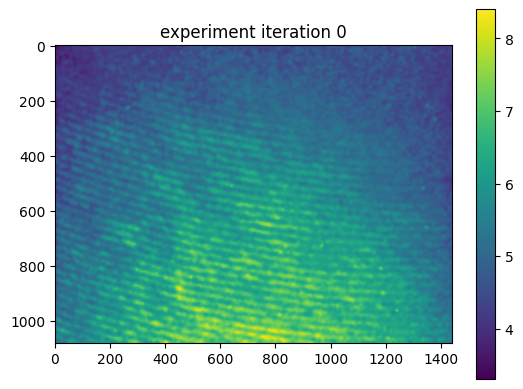

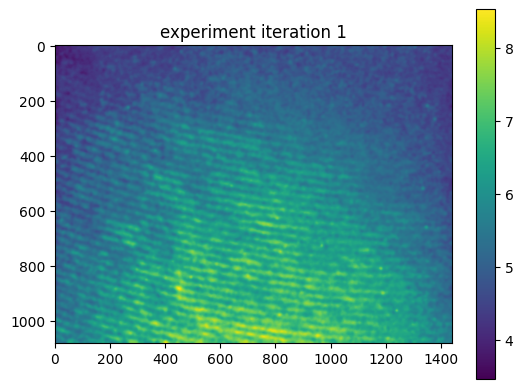

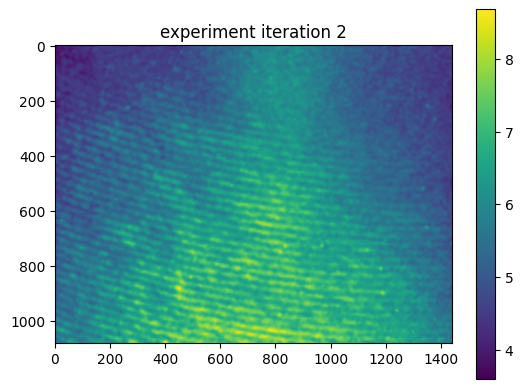

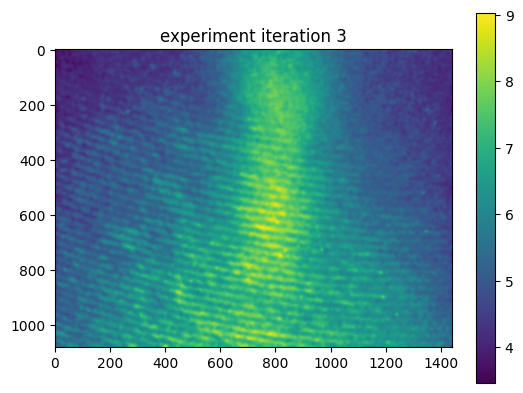

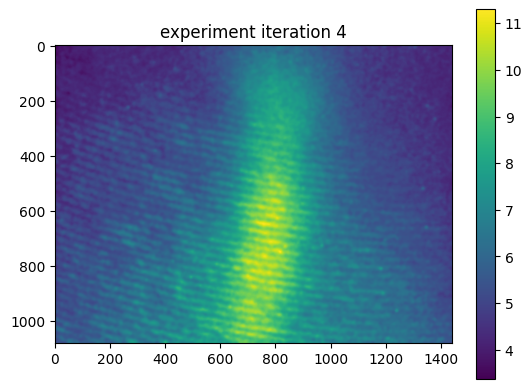

...

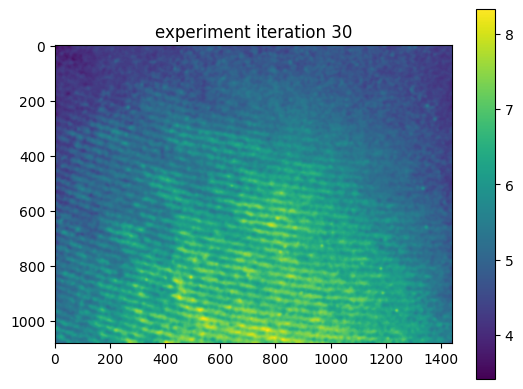

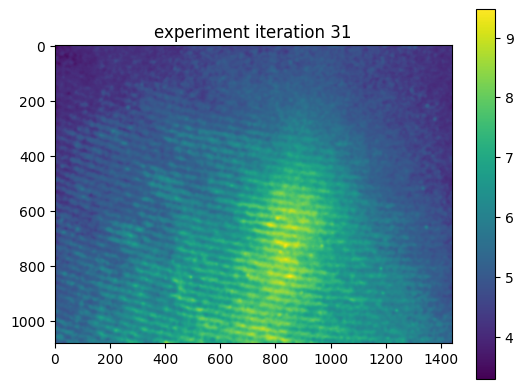

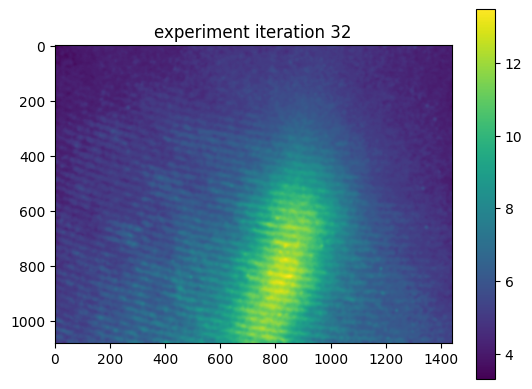

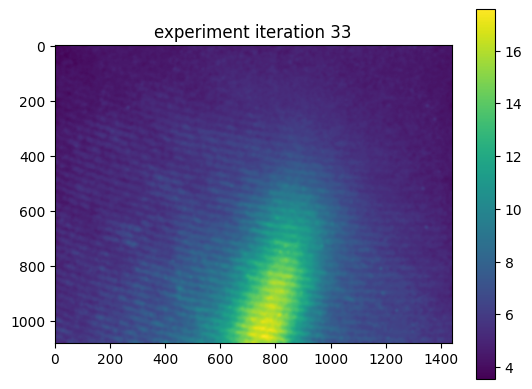

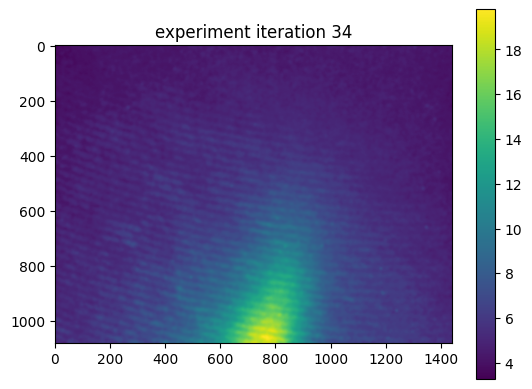

In [61]:
# find the MOT position and half-width along x and y

thor_filenames = [f for f in next(walk(os.path.join(results,datestr,imdir)), 
                             (None, None, []))[2] if f[-3:]=='bmp']  # [] if no file

n_files = len(thor_filenames)

iterations = range((n_files-1)//n_measurements)

# get the dimensions
f = os.path.join(results,datestr,imdir,thor_filenames[0])
mot_bg = np.array(Image.open(f).convert('L')) # background - coil values are set to not form MOT
rows, cols = mot_bg.shape
xpts = range(cols)
ypts = range(rows)

mean_im_list = []

for i in iterations:

    mean_im = np.zeros((rows,cols))
    for measurement in range(n_measurements):
        try:
            f = os.path.join(results,datestr,imdir,thor_filenames[i*n_measurements+measurement])
            raw_im = np.array(Image.open(f).convert('L'))
            # im = ndi.gaussian_filter(ndi.gaussian_filter(mot_bg,10)-raw_im,5)
            im = ndi.gaussian_filter(raw_im,5)
        except Exception as e:
            print(e)
        
        mean_im += im

    mean_im_list.append(mean_im/(measurement+1)) # if we skipped an image, the average is still correctly normalized

    plt.title(f"experiment iteration {i}")
    ax=plt.imshow(mean_im_list[-1])
    plt.colorbar(ax)
    plt.show()

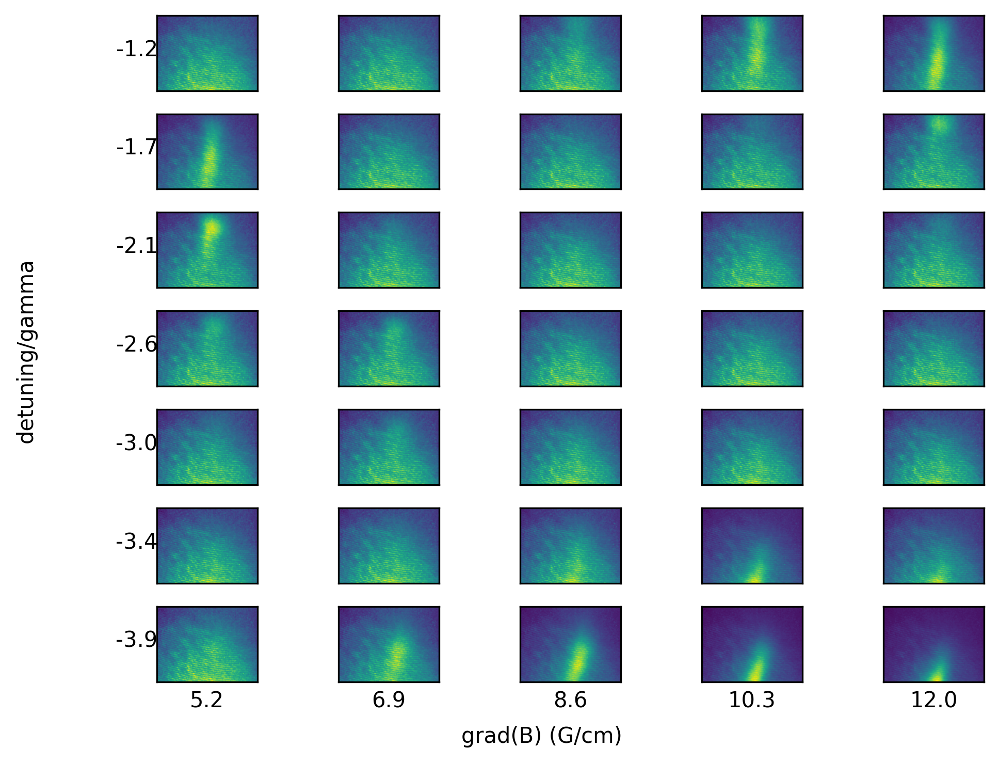

In [63]:
labels = []

# generate the labels in the order as the images were taken in the code
for f_cooling in f_MOT_cooling_DP:
    for dV in dV_Z_coils:
        labels.append(f"dV={dV}\n f_cooling={f_cooling/1e6:.0f}")

coil_driver_gain = 0.228 # the ratio of volts applied to the current driver to amps of current supplied to the coil; measured
G_per_cm_per_A = 10 # from Eunji's measurement. means gradient per A applied to both coils, if we drive each coil with 1 A then the gradient is 10 G/cm/A * 1A = 10 G/cm

# frequencies in MHz
f_single_pass = 130.
f_fiber_AOM = 78.5
gamma = 6.066

gradB_list = (dV_Z_coils + np.mean([AZ_top_default,AZ_bottom_default]))*coil_driver_gain*G_per_cm_per_A
detuning_list = (-2*f_MOT_cooling_DP/1e6+f_single_pass+f_fiber_AOM)/gamma

nrows = len(f_MOT_cooling_DP)
ncols = len(dV_Z_coils)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,dpi=300)
for ax,lbl,im in zip(axes.flat,labels,mean_im_list):
    # ax.set_title(lbl) # this is just used as a check that the plot ordering is correct
    ax.imshow(im)
    ax.set_xticks([])
    ax.set_yticks([])
[axes[-1,ncols-i-1].set_xlabel(round(gradB_list[ncols-i-1],1)) for i in range(ncols)]
[axes[nrows-i-1,0].set_ylabel(round(detuning_list[nrows-i-1],1),rotation=0) for i in range(nrows)]
[axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
fig.text(0.4,-0.01, "grad(B) (G/cm)")
fig.text(-0.05,0.4, "detuning/gamma",rotation=90)

fig.tight_layout()
# plt.savefig(exp_id+"MOTDetuningAndGradBScan.pdf",bbox_inches='tight')

## 2023.12.18

In [55]:
datestr = "2023-12-18\\11\\"
exp_id = '000008625'
imdir = exp_id + '_images'

# f = h5py.File(os.path.join(results, datestr, f'{exp_id}-MOTDetuningAndGradBScan.h5')) # corrupt :P
f = h5py.File(os.path.join(results, "2023-12-17\\16\\", f'000008619-MOTDetuningAndGradBScan.h5')) # same params as the one above, from yesterday

datestr = "2023-12-18\\15\\"
exp_id = '000008630'
imdir = exp_id + '_images'

f = h5py.File(os.path.join(results, datestr, f'{exp_id}-MOTDetuningAndGradBScan.h5')) # corrupt :P

n_measurements = np.array(f['datasets']['n_measurements'])
counts = np.array(f['datasets']['photocounts'])[1:]
AZ_bottom_default = np.array(f['datasets']['AZ_bottom_default'])
AZ_top_default = np.array(f['datasets']['AZ_top_default'])
f_MOT_cooling_DP = eval_str_from_h5(np.array(f['datasets']['f_MOT_cooling_DP']))
dV_Z_coils = eval_str_from_h5(np.array(f['datasets']['dV_Z_coils']))
fort_volts = np.array(f['datasets']['FORT_monitor'])[1:]

### ThorCam image processing

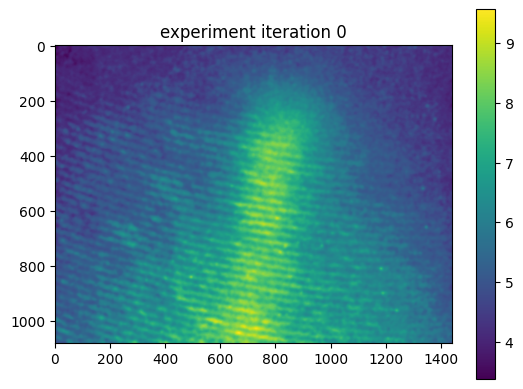

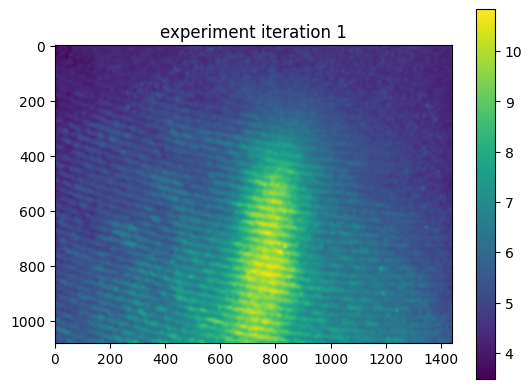

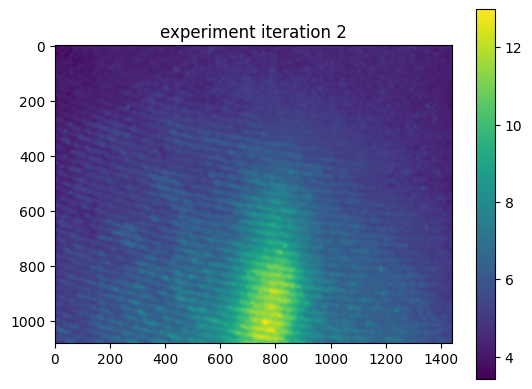

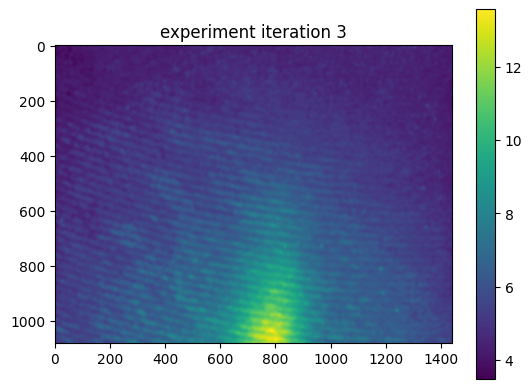

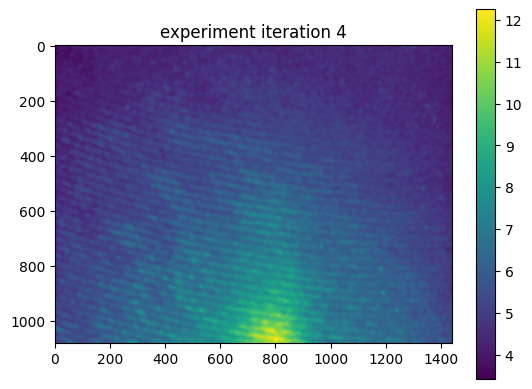

...

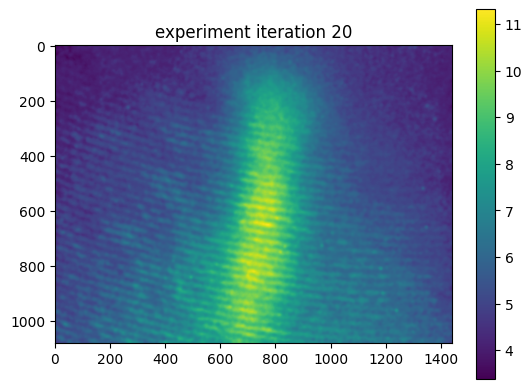

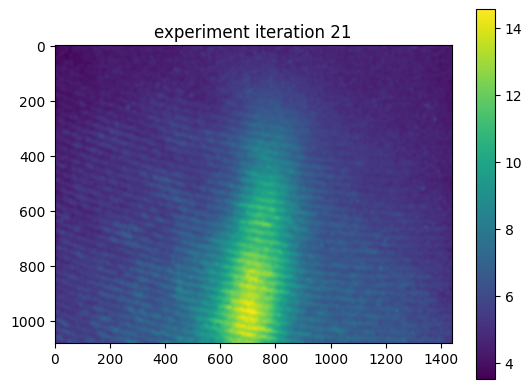

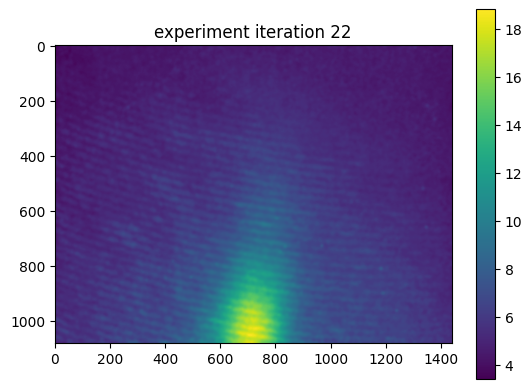

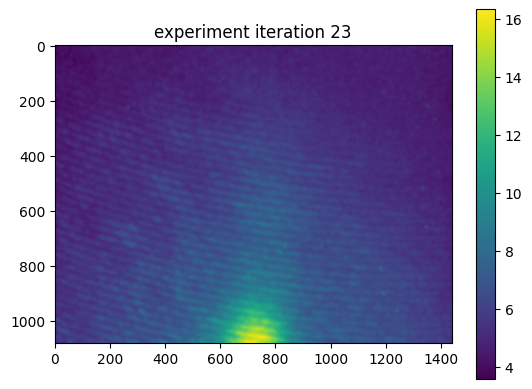

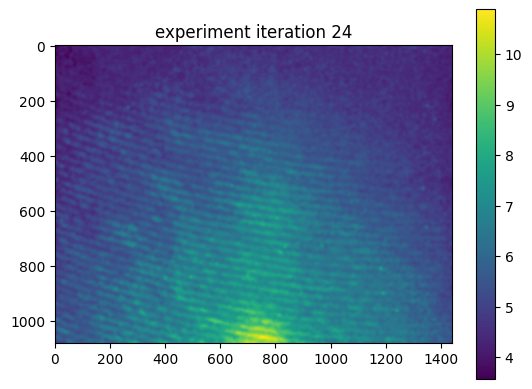

In [57]:
# find the MOT position and half-width along x and y

thor_filenames = [f for f in next(walk(os.path.join(results,datestr,imdir)), 
                             (None, None, []))[2] if f[-3:]=='bmp']  # [] if no file

n_files = len(thor_filenames)

iterations = range((n_files-1)//n_measurements)

# get the dimensions
f = os.path.join(results,datestr,imdir,thor_filenames[0])
mot_bg = np.array(Image.open(f).convert('L')) # background - coil values are set to not form MOT
rows, cols = mot_bg.shape
xpts = range(cols)
ypts = range(rows)

mean_im_list = []

for i in iterations:

    mean_im = np.zeros((rows,cols))
    for measurement in range(n_measurements):
        try:
            f = os.path.join(results,datestr,imdir,thor_filenames[i*n_measurements+measurement])
            raw_im = np.array(Image.open(f).convert('L'))
            # im = ndi.gaussian_filter(ndi.gaussian_filter(mot_bg,10)-raw_im,5)
            im = ndi.gaussian_filter(raw_im,5)
        except Exception as e:
            print(e)
        
        mean_im += im

    mean_im_list.append(mean_im/(measurement+1)) # if we skipped an image, the average is still correctly normalized

    plt.title(f"experiment iteration {i}")
    ax=plt.imshow(mean_im_list[-1])
    plt.colorbar(ax)
    plt.show()

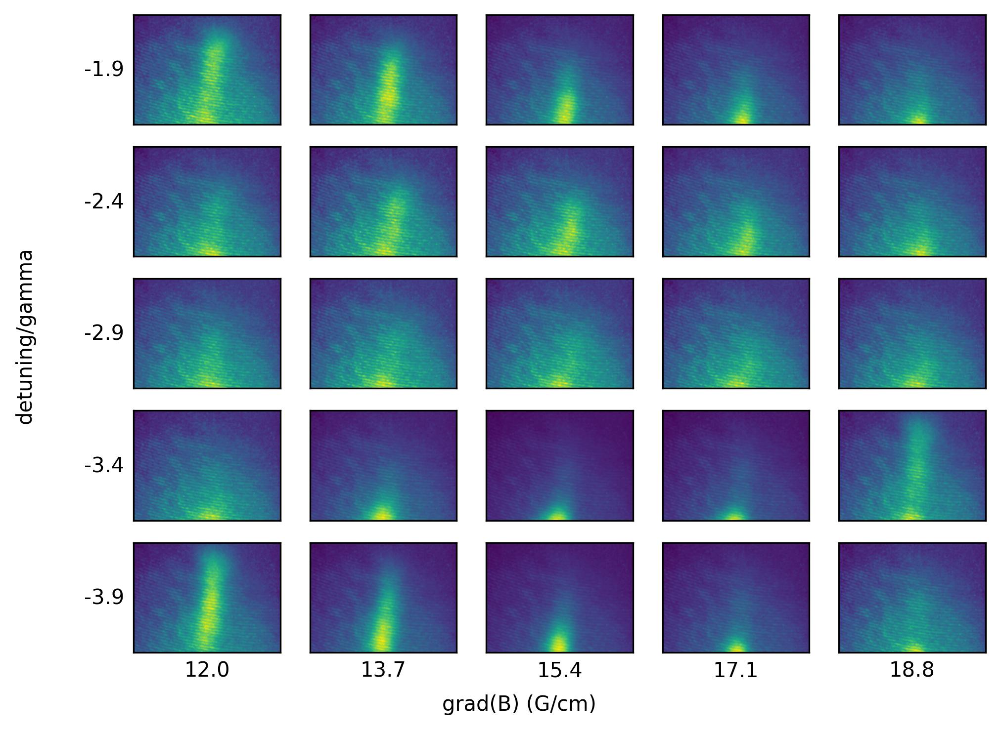

In [59]:
labels = []

# generate the labels in the order as the images were taken in the code
for f_cooling in f_MOT_cooling_DP:
    for dV in dV_Z_coils:
        labels.append(f"dV={dV}\n f_cooling={f_cooling/1e6:.0f}")

coil_driver_gain = 0.228 # the ratio of volts applied to the current driver to amps of current supplied to the coil; measured
G_per_cm_per_A = 10 # from Eunji's measurement. means gradient per A applied to both coils, if we drive each coil with 1 A then the gradient is 10 G/cm/A * 1A = 10 G/cm

# frequencies in MHz
f_single_pass = 130.
f_fiber_AOM = 78.5
gamma = 6.066

gradB_list = (dV_Z_coils + np.mean([AZ_top_default,AZ_bottom_default]))*coil_driver_gain*G_per_cm_per_A
detuning_list = (-2*f_MOT_cooling_DP/1e6+f_single_pass+f_fiber_AOM)/gamma

nrows = len(f_MOT_cooling_DP)
ncols = len(dV_Z_coils)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,dpi=300)
for ax,lbl,im in zip(axes.flat,labels,mean_im_list):
    # ax.set_title(lbl) # this is just used as a check that the plot ordering is correct
    ax.imshow(im)
    ax.set_xticks([])
    ax.set_yticks([])
[axes[-1,ncols-i-1].set_xlabel(round(gradB_list[ncols-i-1],1)) for i in range(ncols)]
[axes[nrows-i-1,0].set_ylabel(round(detuning_list[nrows-i-1],1),rotation=0) for i in range(nrows)]
[axes[nrows-i-1,0].yaxis.set_label_coords(-0.2,0.4) for i in range(nrows)]
fig.text(0.4,-0.01, "grad(B) (G/cm)")
fig.text(-0.05,0.4, "detuning/gamma",rotation=90)

fig.tight_layout()
# plt.savefig(exp_id+"MOTDetuningAndGradBScan.pdf",bbox_inches='tight')